Create a machine learning model that can predict the genre of a
movie based on its plot summary or other textual information. You
can use techniques like TF-IDF or word embeddings with classifiers
such as Naive Bayes, Logistic Regression, or Support Vector
Machines.

###### Import Libraries :

In [1]:
#pip install wordcloud

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from wordcloud import WordCloud
import nltk
import os

The dataset consists of movie-related information sourced from the Internet Movie Database (IMDb). IMDb is a widely recognized online database that provides comprehensive details about movies, TV shows, cast and crew, ratings, reviews, and more. 

In [3]:
# Read the txt files using pandas :

train_file =r'train_data.txt'
test_file =r'test_data.txt'
test_solution_file = r'test_data_solution.txt'

train_data = pd.read_csv(train_file,delimiter=':::' ,header = None ,engine='python')
test_data = pd.read_csv(test_file,delimiter=':::' ,header = None ,engine='python')
test_data_solution = pd.read_csv(test_solution_file,delimiter=':::' ,header = None ,engine='python')

##### Exploratory Data Analysis :

In [4]:
print(train_data.shape)

(54214, 4)


In [5]:
train_data.head()

,0,1,2,3
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [6]:
print(test_data_solution.shape)

(54200, 4)


In [7]:
test_data_solution.head()

,0,1,2,3
0,1,Edgar's Lunch (1998),thriller,"L.R. Brane loves his life - his car, his apar..."
1,2,La guerra de papá (1977),comedy,"Spain, March 1964: Quico is a very naughty ch..."
2,3,Off the Beaten Track (2010),documentary,One year in the life of Albin and his family ...
3,4,Meu Amigo Hindu (2015),drama,"His father has died, he hasn't spoken with hi..."
4,5,Er nu zhai (1955),drama,Before he was known internationally as a mart...


##### Checking null values:

In [8]:
train_data.isna().sum()

0    0
1    0
2    0
3    0
dtype: int64

In [9]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54214 entries, 0 to 54213
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   0       54214 non-null  int64 
 1   1       54214 non-null  object
 2   2       54214 non-null  object
 3   3       54214 non-null  object
dtypes: int64(1), object(3)
memory usage: 1.7+ MB


In [10]:
test_data_solution.isna().sum()

0    0
1    0
2    0
3    0
dtype: int64

In [11]:
test_data_solution.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54200 entries, 0 to 54199
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   0       54200 non-null  int64 
 1   1       54200 non-null  object
 2   2       54200 non-null  object
 3   3       54200 non-null  object
dtypes: int64(1), object(3)
memory usage: 1.7+ MB


##### we will conccate the test data solution file and train file :

In [12]:
dataf = pd.concat((train_data,test_data_solution))
dataf.columns = ['id','Title','Genre','Description']

In [13]:
print('shape',dataf.shape)
dataf.head()

shape (108414, 4)


,id,Title,Genre,Description
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


##### Data Cleaning and PreProcessing :

In [14]:
# Check Duplicates in Data :
dataf.duplicated().sum()

0

In [15]:
# remove it:
dataf.dropna(inplace = True)

In [16]:
# Check Nan in Data :
dataf.isna().sum()

#remove :
dataf.dropna(inplace = True)

In [17]:
dataf.shape

(108414, 4)

In [18]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import string

# Sample data
data = {
    'id': [1, 2],
    'Title': ["Edgar's Lunch (1998)", "La guerra de papá (1977)"],
    'Genre': ["", ""],
    'Description': [
        "L.R. Brane loves his life - his car, his apartment, his job, but especially his girlfriend, Vespa. One day while showering, Vespa runs out of shampoo. L.R. runs across the street to a convenience store to buy some more, a quick trip of no more than a few minutes. When he returns, Vespa is gone and every trace of her existence has been wiped out. L.R.'s life becomes a tortured existence as one strange event after another occurs to confirm in his mind that a conspiracy is working against his finding Vespa.",
        "Spain, March 1964: Quico is a very naughty child of three belonging to a wealthy middle-class family. Since Cristina's birth, he feels he has lost the privileged position of 'prince' of the house for his eight months old sister. So, with his brother Juan, who is eight years old and is quite disobedient, spend their time committing prank after prank, causing the resulting anger of his mother, the nanny and the old housemaid. The rest of the family members are two much older brothers, his resigned mother and a retrograde father of authoritarian ideas. But many years have passed, and the civil war that won the despot Don Pablo is simply for their children 'Dad's war'."
    ]
}

df = pd.DataFrame(data)

# Download NLTK resources (if not already downloaded)
nltk.download('punkt')
nltk.download('stopwords')

# Function for text preprocessing
def preprocess_text(text):
    # Convert to lowercase
    text = text.lower()
    
    # Remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    
    # Tokenize
    tokens = word_tokenize(text)
    
    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]
    
    # Join tokens back into a single string
    preprocessed_text = ' '.join(tokens)
    
    return preprocessed_text

# Apply preprocessing to the "Description" column
df['Description'] = df['Description'].apply(preprocess_text)

# Display the preprocessed DataFrame
print(df)


   id                     Title Genre  \
0   1      Edgar's Lunch (1998)         
1   2  La guerra de papá (1977)         

                                         Description  
0  lr brane loves life car apartment job especial...  
1  spain march 1964 quico naughty child three bel...  


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\prath\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\prath\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [19]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import string

# Download NLTK resources (if not already downloaded)
nltk.download('punkt')
nltk.download('stopwords')

# Function for text preprocessing
def preprocess_text(text):
    # Convert to lowercase
    text = text.lower()
    
    # Remove punctuation :
    
     # Remove punctuation using regular expressions
    text = re.sub(r'[^\w\s]', '', text)
    
    # Remove specific characters #, @, and $
    text = re.sub(r'[#@\$]', '', text)
   # text = text.translate(str.maketrans('', '', string.punctuation))
    
    
    # Tokenize
    tokens = word_tokenize(text)
    
    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]
    
    # Join tokens back into a single string
    preprocessed_text = ' '.join(tokens)
    
    return preprocessed_text


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\prath\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\prath\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [20]:
# Apply preprocessing to the "Description" column
dataf['Description_processed'] = dataf['Description'].apply(preprocess_text)


In [21]:
# Display the preprocessed DataFrame
dataf.head()

,id,Title,Genre,Description,Description_processed
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...


In [22]:
genre = dataf['Genre'].value_counts()
genre

 drama           27225
 documentary     26192
 comedy          14893
 short           10145
 horror           4408
 thriller         3181
 action           2629
 western          2064
 reality-tv       1767
 family           1567
 adventure        1550
 music            1462
 romance          1344
 sci-fi           1293
 adult            1180
 crime            1010
 animation         996
 sport             863
 talk-show         782
 fantasy           645
 mystery           637
 musical           553
 biography         529
 history           486
 game-show         387
 news              362
 war               264
Name: Genre, dtype: int64

##### Data Visualization 

Will try to analyse the data using Histogram and Bar Chart.
And will show word cloud for each genre.

In [23]:
import plotly.express as px

genre = dataf['Genre'].value_counts()
fig = px.bar(genre, x=genre.index, y=genre, title='Genre Distribution')
fig.update_layout(xaxis_title='Genre', yaxis_title='Count')
fig.show()

In [24]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


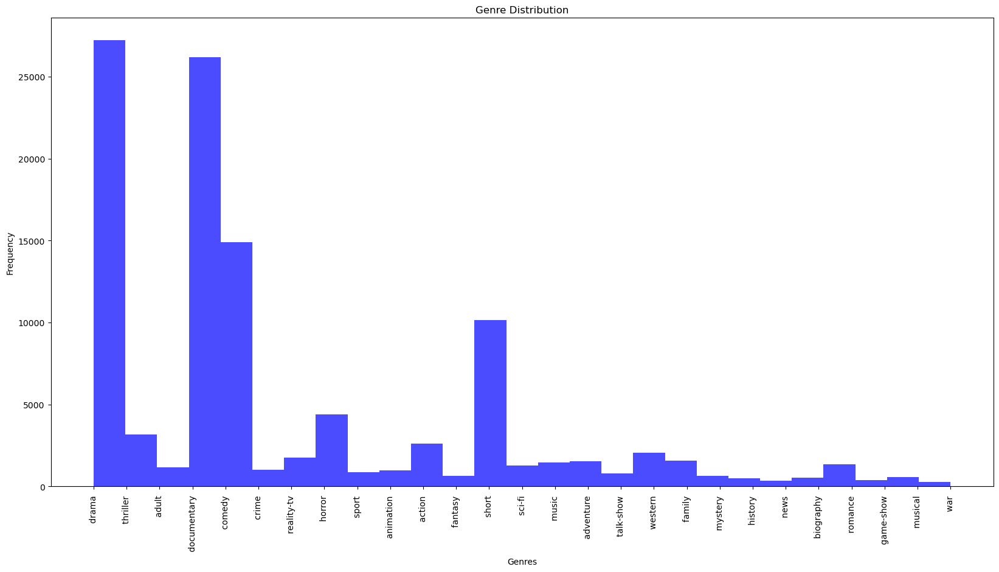

In [25]:
# Create a histogram of genre distribution
plt.figure(figsize=(20, 10))
plt.hist(dataf["Genre"],bins =27 , color='blue', alpha=0.7)
plt.title("Genre Distribution")
plt.xlabel("Genres")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.show()


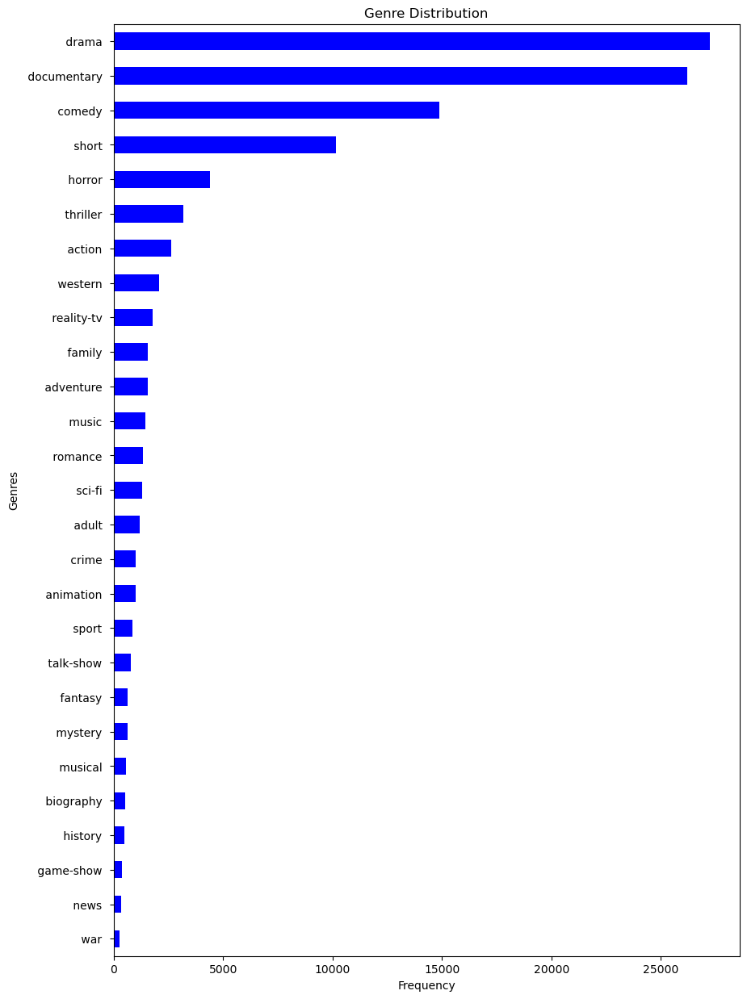

In [26]:
## View genre distribution on Horizontal graph

genre_counts = dataf["Genre"].value_counts()
sorted_genres = genre_counts.sort_values(ascending=True)
# Create a horizontal histogram of genre distribution
plt.figure(figsize=(10, 15))
sorted_genres.plot(kind='barh',color = "blue", alpha=1 )
plt.title("Genre Distribution")
plt.xlabel("Frequency")
plt.ylabel("Genres")
plt.show()

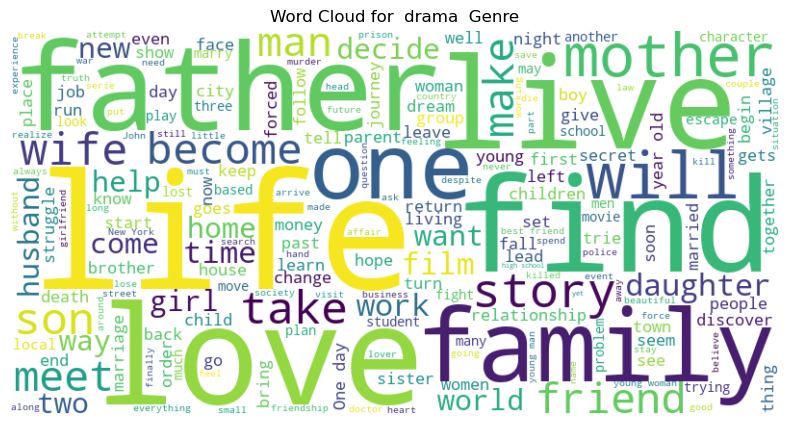

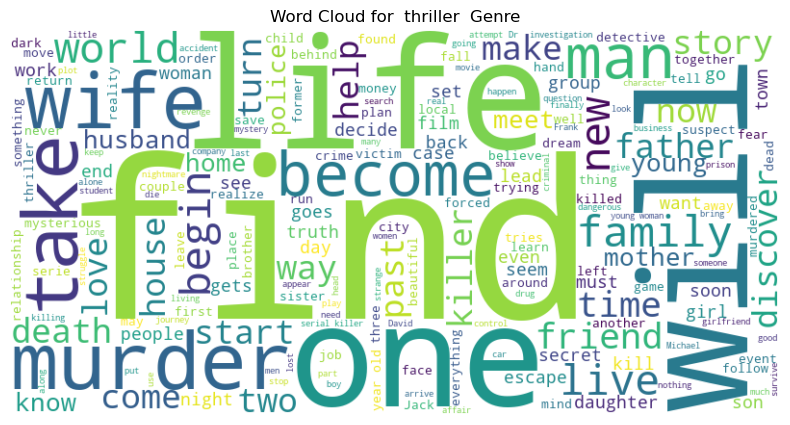

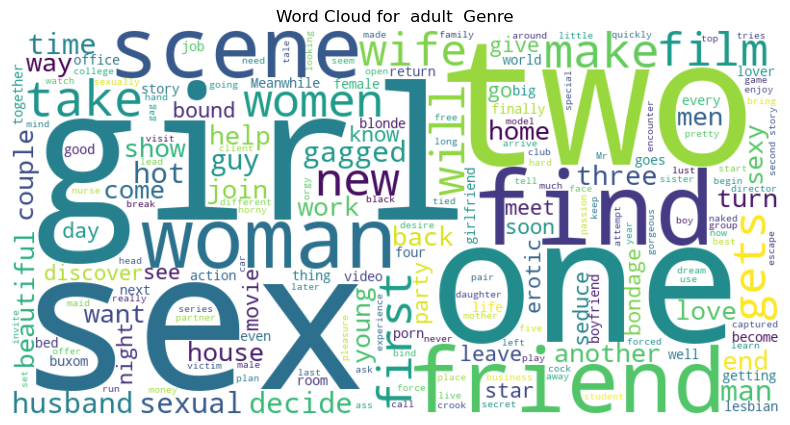

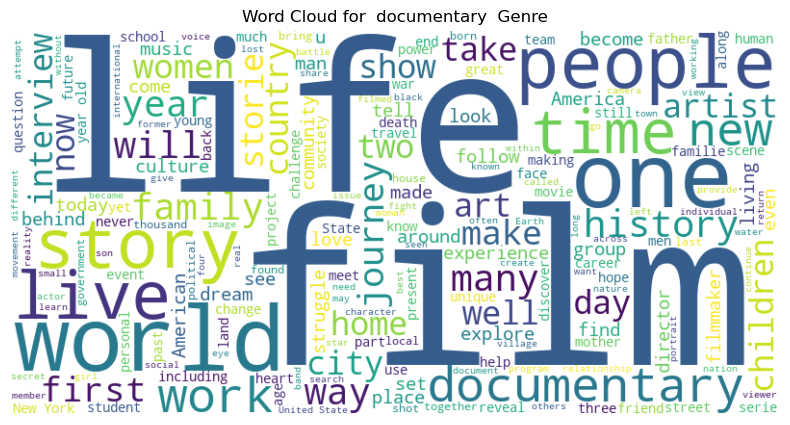

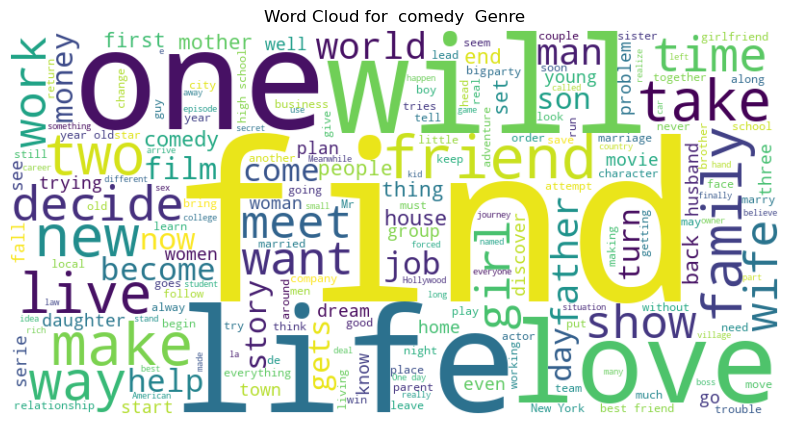

...

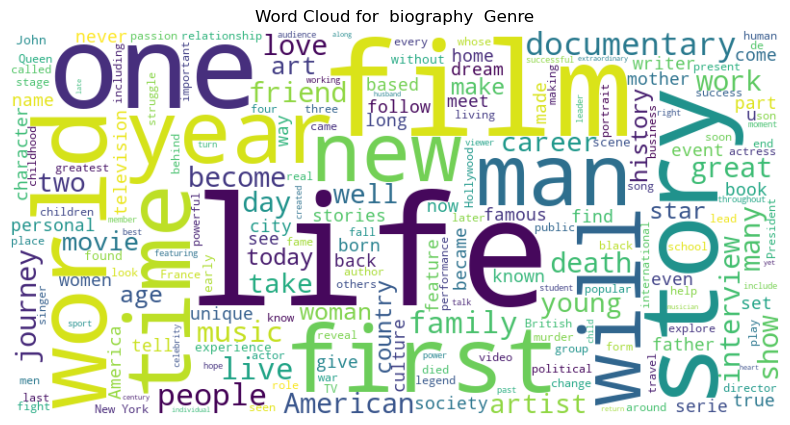

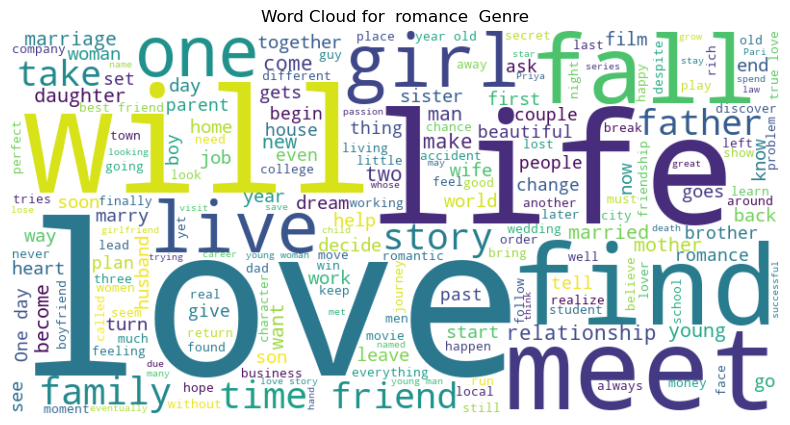

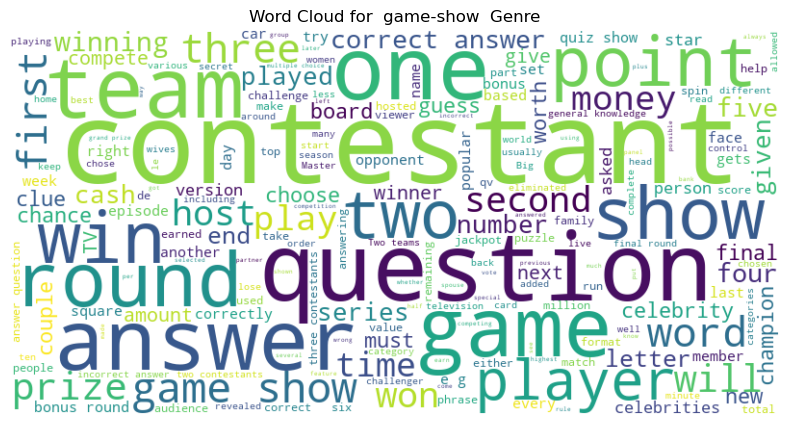

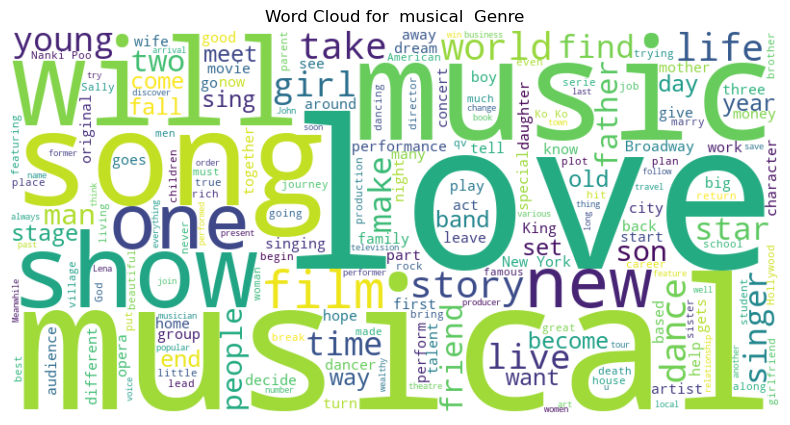

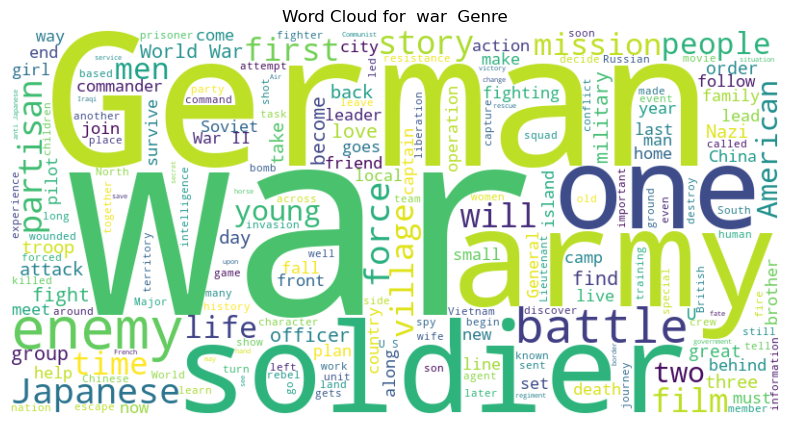

In [27]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Generate word clouds for each unique genre
unique_genres = dataf['Genre'].unique()

for genre in unique_genres:
    # Filter data for the current genre
    genre_data = dataf[dataf['Genre'] == genre]

    # Combine all descriptions into a single string
    all_descriptions = ' '.join(genre_data['Description'])

    # Generate word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_descriptions)

    # Plot the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {genre} Genre')
    plt.axis('off')
    plt.show()

#### Feature Engineering :

In [28]:
## remove id column from head 
data = dataf.drop(["Title","id"] , axis = 1) # will drop column 
data.head()

,Genre,Description,Description_processed
0,drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...
1,thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...
2,adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...
3,drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...
4,drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...


Importing necessary libraries for model selection and training

In [29]:
## import necessary library for
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier 

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.model_selection import train_test_split

from sklearn.metrics import classification_report,confusion_matrix,ConfusionMatrixDisplay

#### Converting Genre into Numerical form

In [30]:
#Convert sentiment labels to numerical values for modeling
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
data['Genre_encoded'] = label_encoder.fit_transform(data['Genre'])
data['Genre_encoded']

class_names= list(label_encoder.classes_)
class_names   

[' action ',
 ' adult ',
 ' adventure ',
 ' animation ',
 ' biography ',
 ' comedy ',
 ' crime ',
 ' documentary ',
 ' drama ',
 ' family ',
 ' fantasy ',
 ' game-show ',
 ' history ',
 ' horror ',
 ' music ',
 ' musical ',
 ' mystery ',
 ' news ',
 ' reality-tv ',
 ' romance ',
 ' sci-fi ',
 ' short ',
 ' sport ',
 ' talk-show ',
 ' thriller ',
 ' war ',
 ' western ']

In [31]:
data.head()

,Genre,Description,Description_processed,Genre_encoded
0,drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...,8
1,thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...,24
2,adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...,1
3,drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...,8
4,drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...,8


##### Split the data to test and train

In [32]:
## Split the data
x = data["Description_processed"]
y = data["Genre"]

x_train ,x_test ,y_train ,y_test = train_test_split(x ,y ,test_size = 0.5)

#### Model training using CountVectorizer technique

In [33]:
vectorize = CountVectorizer()
x_train1 = vectorize.fit_transform(x_train)
x_test1 =  vectorize.transform(x_test)

#### MultinomialNB

Model Score on Training data 0.6397513236297895
Model Score on Training data 0.523806888409246


C:\Users\prath\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

C:\Users\prath\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

C:\Users\prath\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



               precision    recall  f1-score   support

      action        0.03      0.67      0.06        60
       adult        0.03      0.75      0.05        20
   adventure        0.06      0.67      0.11        72
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00         8
      comedy        0.45      0.54      0.49      6238
       crime        0.00      0.00      0.00         0
 documentary        0.90      0.56      0.69     20871
       drama        0.83      0.46      0.59     24517
      family        0.00      0.60      0.01         5
     fantasy        0.00      0.00      0.00         0
   game-show        0.19      0.97      0.32        36
     history        0.00      0.00      0.00         0
      horror        0.25      0.78      0.38       716
       music        0.07      0.89      0.12        54
     musical        0.01      1.00      0.02         3
     mystery        0.00      0.00      0.00         0
        n

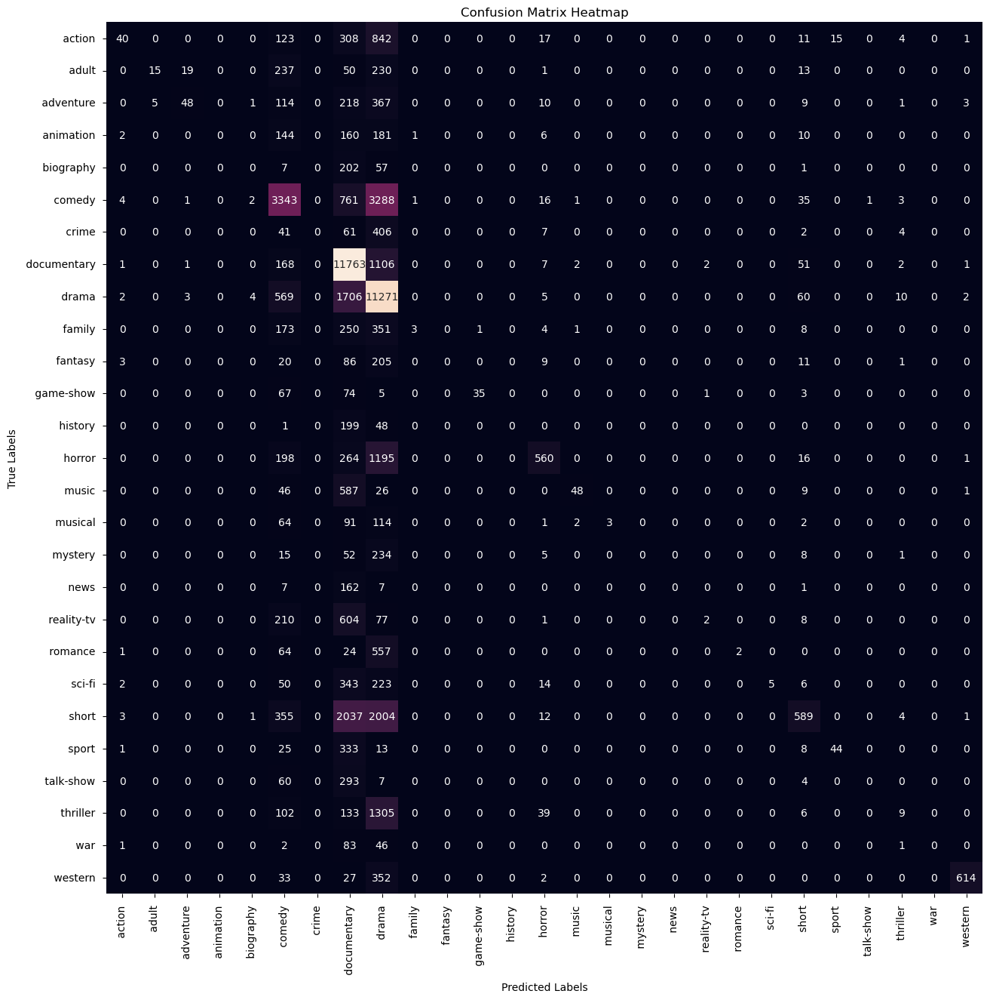

In [34]:
mnb = MultinomialNB()
mnb.fit(x_train1 ,y_train)
print("Model Score on Training data",mnb.score(x_train1 ,y_train))
print("Model Score on Training data",mnb.score(x_test1 ,y_test))
y_pred = mnb.predict(x_test1)

print(classification_report(y_pred ,y_test))
 
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()    

#### LogisticRegression

C:\Users\prath\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Model Score on Training data 0.9973988599258399
Model Score on Training data 0.5680447174719132
               precision    recall  f1-score   support

      action        0.32      0.41      0.36      1081
       adult        0.39      0.57      0.46       392
   adventure        0.22      0.41      0.28       403
   animation        0.18      0.38      0.25       240
   biography        0.00      0.03      0.01        40
      comedy        0.58      0.54      0.56      8149
       crime        0.10      0.22      0.13       236
 documentary        0.78      0.71      0.74     14396
       drama        0.68      0.56      0.62     16509
      family        0.18      0.34      0.23       405
     fantasy        0.10      0.31      0.15       105
   game-show        0.64      0.75      0.69       159
     history        0.01      0.07      0.02        42
      horror        0.58      0.63      0.61      2055
       music        0.51      0.64      0.56       568
     musical        0.0

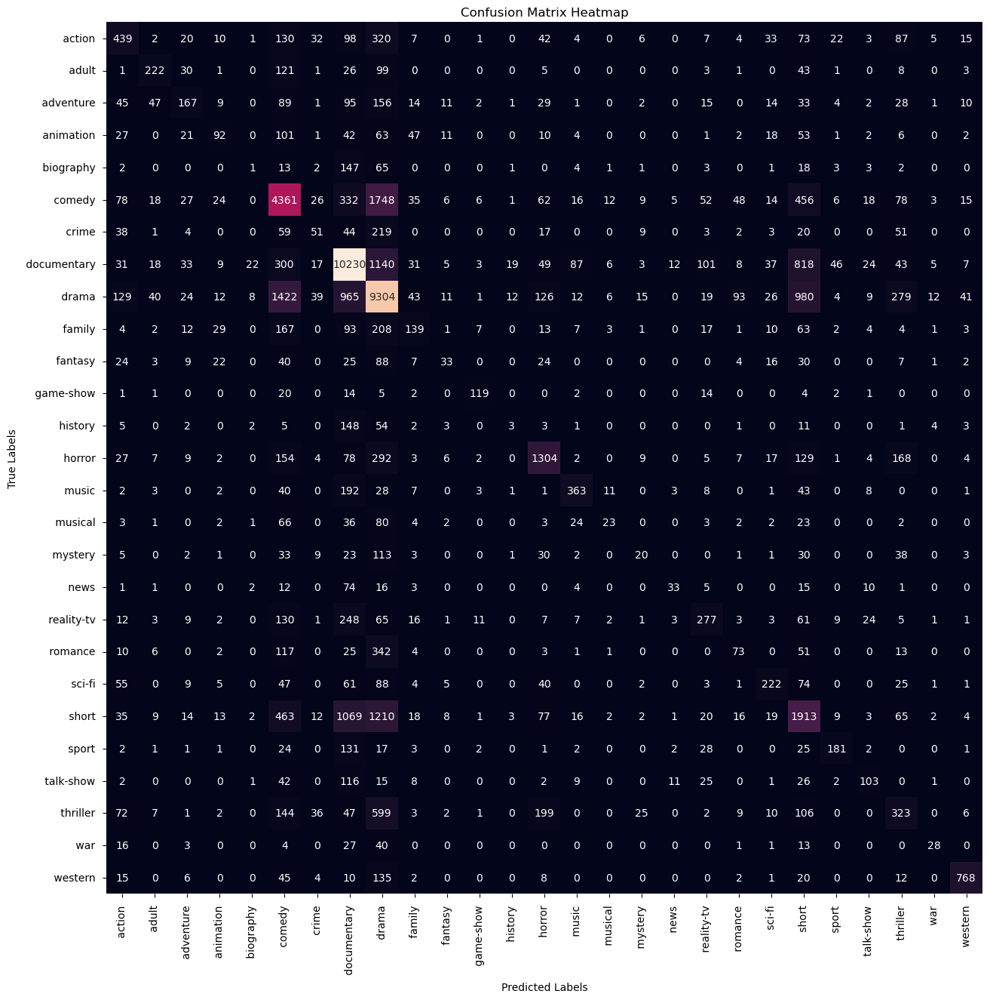

In [35]:
## select Logistic regression for this
model = LogisticRegression()
model.fit(x_train1 ,y_train)
print("Model Score on Training data",model.score(x_train1 ,y_train))
print("Model Score on Training data",model.score(x_test1 ,y_test))
y_pred = model.predict(x_test1)
print(classification_report(y_pred ,y_test))


cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

#### Support Vector Machine ( SVC )

C:\Users\prath\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



Model Score on Training data 0.999631043961112
Model Score on Training data 0.5165937978489863
               precision    recall  f1-score   support

      action        0.29      0.33      0.31      1193
       adult        0.40      0.48      0.44       468
   adventure        0.22      0.32      0.26       543
   animation        0.16      0.29      0.21       285
   biography        0.02      0.04      0.03       125
      comedy        0.52      0.50      0.51      7850
       crime        0.10      0.15      0.12       328
 documentary        0.73      0.69      0.71     13794
       drama        0.59      0.54      0.57     15026
      family        0.17      0.25      0.20       539
     fantasy        0.07      0.12      0.09       190
   game-show        0.67      0.65      0.66       190
     history        0.01      0.02      0.01       107
      horror        0.55      0.54      0.55      2243
       music        0.48      0.56      0.52       617
     musical        0.09

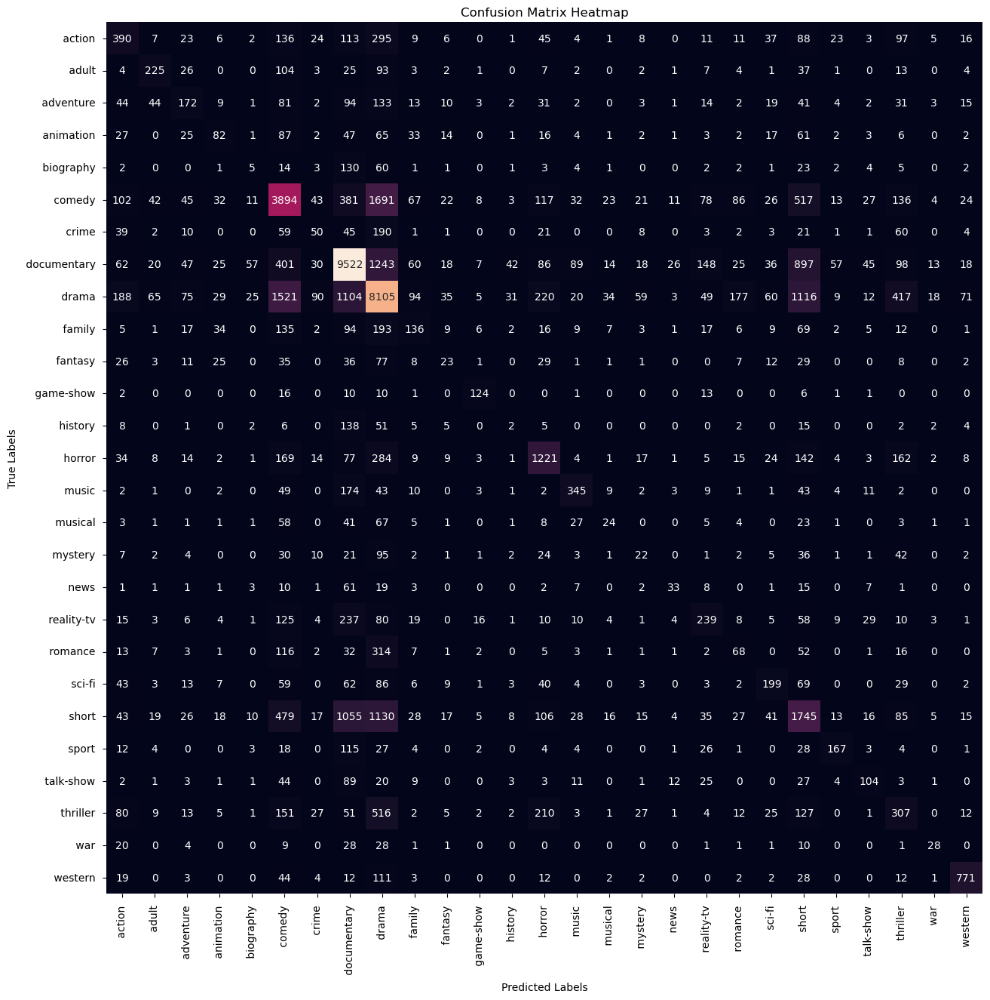

In [36]:
## Select SVC model

svm = LinearSVC()
svm.fit(x_train1 ,y_train)
print("Model Score on Training data",svm.score(x_train1 ,y_train))
print("Model Score on Training data",svm.score(x_test1 ,y_test))
y_pred = svm.predict(x_test1)
print(classification_report(y_pred ,y_test))
## As we can see from accuracy that the model the not performing well



cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

#### RandomForestClassifier

Random Forest - Train Score: 0.999631043961112
Random Forest - Test Score: 0.48698507572822697


C:\Users\prath\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

C:\Users\prath\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

C:\Users\prath\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



               precision    recall  f1-score   support

      action        0.01      0.53      0.01        15
       adult        0.07      0.84      0.13        49
   adventure        0.11      0.76      0.19       111
   animation        0.00      0.33      0.00         3
   biography        0.00      0.00      0.00         1
      comedy        0.26      0.56      0.35      3457
       crime        0.01      1.00      0.01         3
 documentary        0.88      0.56      0.68     20811
       drama        0.85      0.41      0.55     28291
      family        0.02      0.74      0.04        23
     fantasy        0.00      0.00      0.00         0
   game-show        0.45      0.86      0.59        97
     history        0.00      0.00      0.00         0
      horror        0.09      0.77      0.16       255
       music        0.08      0.94      0.15        64
     musical        0.02      1.00      0.04         6
     mystery        0.00      0.00      0.00         0
        n

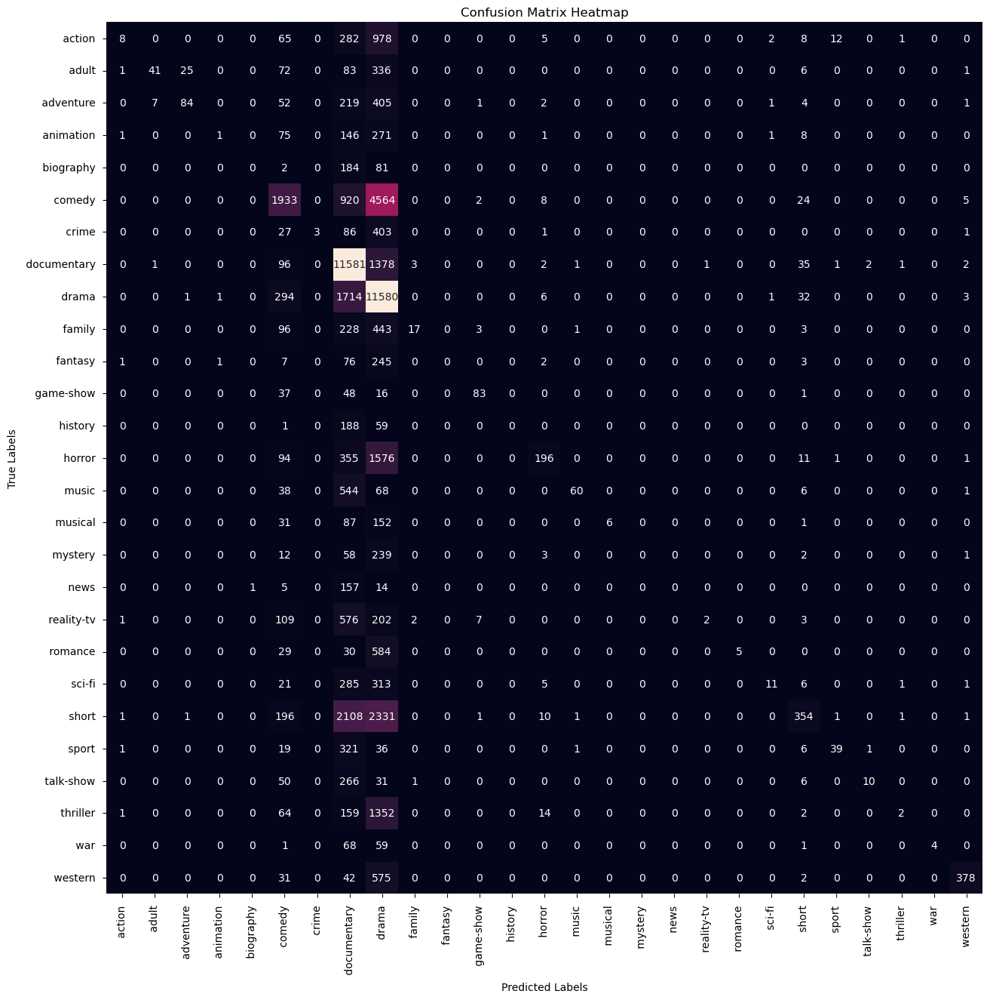

In [37]:
# Create a Random Forest model
random_forest = RandomForestClassifier()

# Fit the model with GridSearchCV
random_forest.fit(x_train1, y_train)
print("Random Forest - Train Score:",random_forest.score(x_train1, y_train))
print("Random Forest - Test Score:", random_forest.score(x_test1, y_test))

y_pred = random_forest.predict(x_test1)
print(classification_report(y_pred ,y_test))



cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

#### use TfidfVectorizer techniquem

In [38]:
## Using TfidfVectorizer technique
vectorizer = TfidfVectorizer()
x_train2 = vectorize.fit_transform(x_train)
x_test2 =  vectorize.transform(x_test)


#### MultinomialNB with TfidfVectorizer

Model Score on Training data 0.6397513236297895
Model Score on Training data 0.523806888409246


C:\Users\prath\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

C:\Users\prath\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

C:\Users\prath\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



               precision    recall  f1-score   support

      action        0.03      0.67      0.06        60
       adult        0.03      0.75      0.05        20
   adventure        0.06      0.67      0.11        72
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00         8
      comedy        0.45      0.54      0.49      6238
       crime        0.00      0.00      0.00         0
 documentary        0.90      0.56      0.69     20871
       drama        0.83      0.46      0.59     24517
      family        0.00      0.60      0.01         5
     fantasy        0.00      0.00      0.00         0
   game-show        0.19      0.97      0.32        36
     history        0.00      0.00      0.00         0
      horror        0.25      0.78      0.38       716
       music        0.07      0.89      0.12        54
     musical        0.01      1.00      0.02         3
     mystery        0.00      0.00      0.00         0
        n

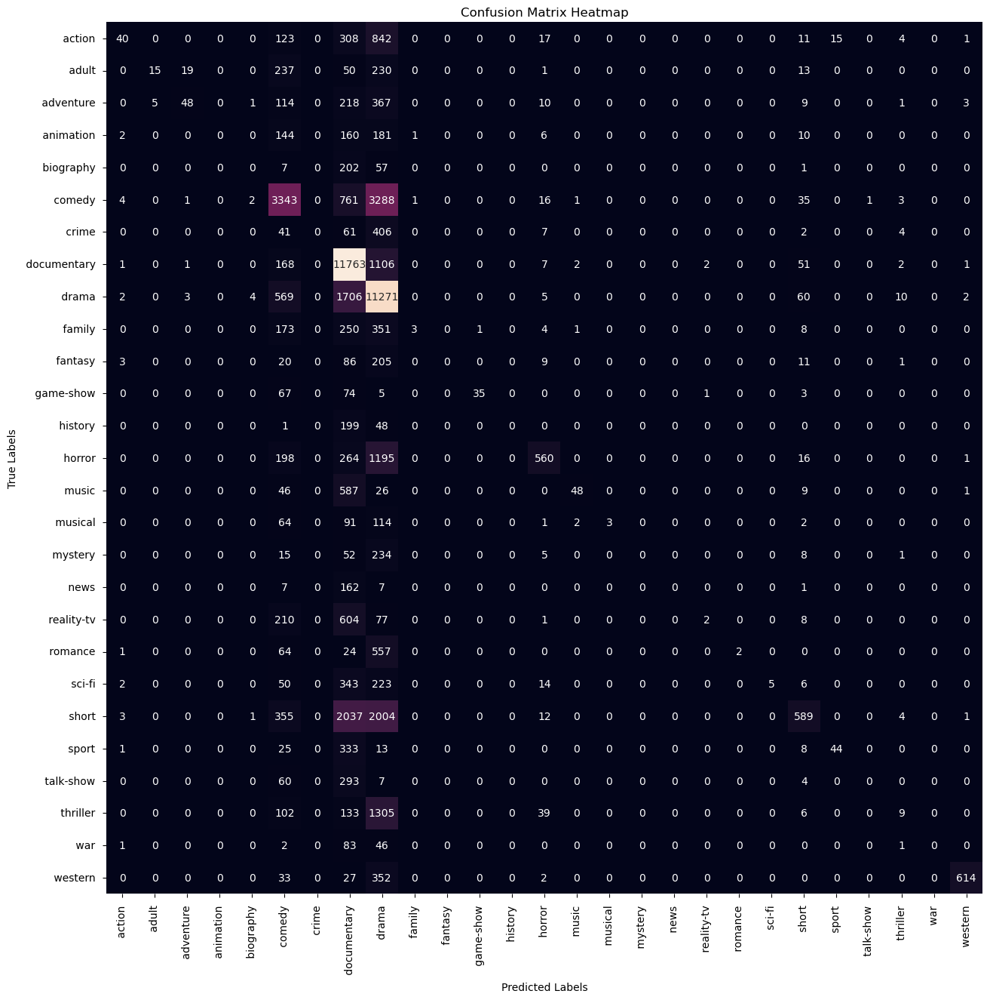

In [39]:
mnb = MultinomialNB()
mnb.fit(x_train2 ,y_train)
print("Model Score on Training data",mnb.score(x_train2 ,y_train))
print("Model Score on Training data",mnb.score(x_test2 ,y_test))
y_pred = mnb.predict(x_test2)
print(classification_report(y_pred ,y_test))


cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

#### Support Vector Machine ( SVC ) with TfidfVectorizer

C:\Users\prath\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



Model Score on Training data 0.999631043961112
Model Score on Training data 0.5166860368587083
               precision    recall  f1-score   support

      action        0.29      0.33      0.31      1193
       adult        0.40      0.48      0.44       469
   adventure        0.22      0.32      0.26       543
   animation        0.16      0.29      0.21       285
   biography        0.02      0.04      0.03       124
      comedy        0.52      0.50      0.51      7851
       crime        0.10      0.15      0.12       328
 documentary        0.73      0.69      0.71     13792
       drama        0.59      0.54      0.57     15029
      family        0.17      0.25      0.20       539
     fantasy        0.07      0.12      0.09       189
   game-show        0.67      0.65      0.66       190
     history        0.01      0.02      0.01       107
      horror        0.55      0.54      0.55      2244
       music        0.48      0.56      0.52       617
     musical        0.09

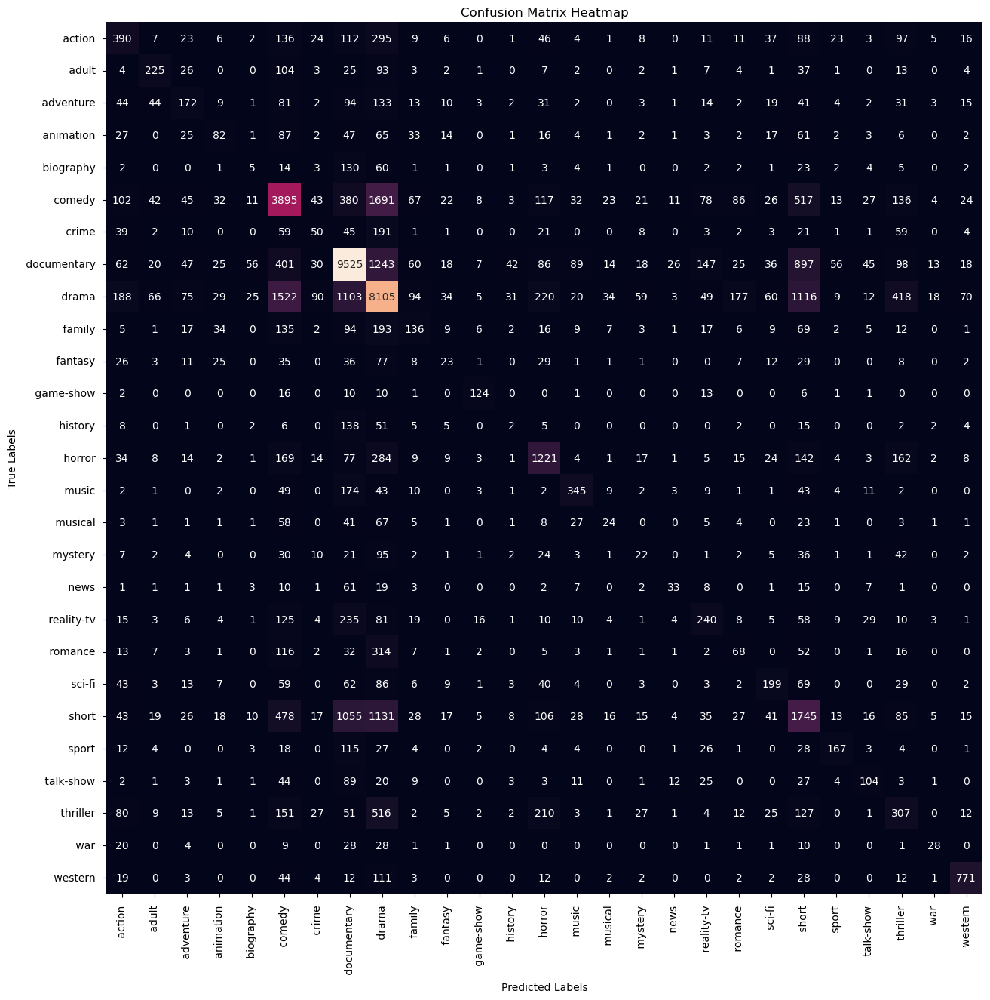

In [40]:
## Select SVC model

svm = LinearSVC()
svm.fit(x_train2 ,y_train)
print("Model Score on Training data",svm.score(x_train2 ,y_train))
print("Model Score on Training data",svm.score(x_test2 ,y_test))
y_pred = svm.predict(x_test2)
print(classification_report(y_pred ,y_test))
## As we can see from accuracy that the model the not performing well



cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

#### RandomForestClassifier with TfidfVectorizer

Random Forest - Train Score: 0.999631043961112
Random Forest - Test Score: 0.48729868836128176


C:\Users\prath\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

C:\Users\prath\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

C:\Users\prath\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



               precision    recall  f1-score   support

      action        0.01      0.73      0.01        11
       adult        0.05      0.67      0.10        43
   adventure        0.09      0.72      0.16        95
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00         1
      comedy        0.26      0.56      0.35      3440
       crime        0.01      1.00      0.02         4
 documentary        0.89      0.56      0.68     20839
       drama        0.85      0.41      0.55     28280
      family        0.02      0.75      0.04        24
     fantasy        0.00      0.00      0.00         0
   game-show        0.47      0.89      0.61        98
     history        0.00      0.00      0.00         3
      horror        0.11      0.73      0.19       343
       music        0.08      0.92      0.15        64
     musical        0.02      1.00      0.04         6
     mystery        0.00      0.00      0.00         0
        n

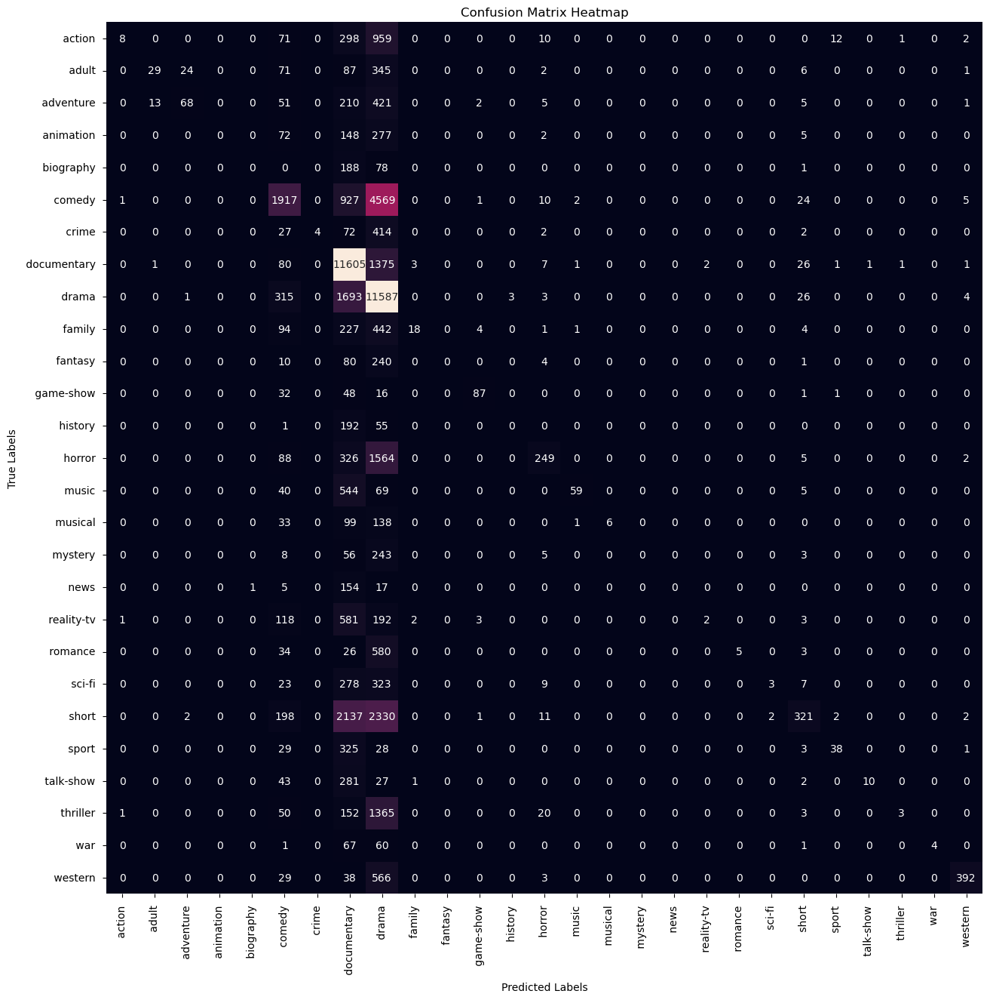

In [41]:
# Create a Random Forest model
random_forest = RandomForestClassifier()


# Fit the model with GridSearchCV
random_forest.fit(x_train2, y_train)


print("Random Forest - Train Score:",random_forest.score(x_train2, y_train))
print("Random Forest - Test Score:", random_forest.score(x_test2, y_test))

y_pred = random_forest.predict(x_test2)
print(classification_report(y_pred ,y_test))



cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

#### Conclusion :

 This project provides a comprehensive evaluation of different classifiers for genre classification tasks. While Logistic Regression emerged as the top performer in this context, ongoing exploration and refinement of models remain crucial for achieving even greater accuracy and reliability in genre predictions. 